**Animating in python:**

I would like to show a clever trick to animate things hopefully making it easier. Currently, we learned how to animate by having to rewrite whatever function we are animating as it's own "frame function", however I ran into many difficulties doing this and it can make it hard since we typically write our code without animation first to make sure it works, and then adapt it to animation. The idea is to just make our own array consiting of the frames we want that can be quickly added to our already existing function. Below is an example of this. The biggest advantage of doing it this way is that we don't have to rewrite and think about our already existing function but rather just add a couple lines of code. We are also able to modulate how often we want frames to be made for if we need to speed up the runtime we can do so very easily. The example was taken from my solution for the first problem of problem set 3.

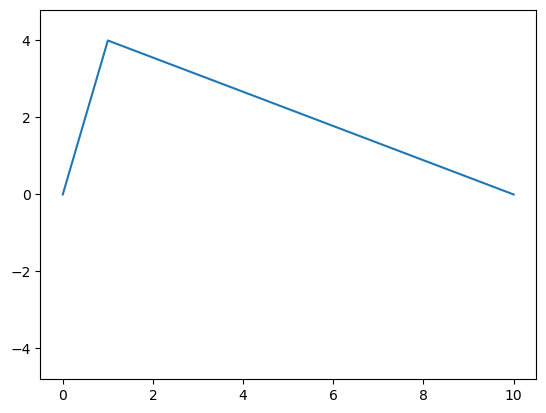

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
plt.rcParams["animation.html"] = "jshtml" 
def stringinit(L, peak, xi, p):
    x = np.arange(0, L + xi, xi)
    y = np.where(x <= p*L,
                 peak/(p*L) * x,            # rising piece
                 peak*(L - x)/((1-p)*L))    # falling piece
    return [y, x]
L=10
peak=4
yi,x=stringinit(L,peak,.01,.1)
vl=np.zeros(yi.size)

#Calculate motion for each point for one timestep
def kinematic(yi,c,h,dt,vi):
    a=np.zeros(yi.size)
    v=np.zeros(yi.size)
    y=np.zeros(yi.size)
    for l in range(1,yi.size-1):
        a[l]=c**2*(yi[l-1]-2*yi[l]+yi[l+1])/h**2
        v[l]=a[l]*dt+vi[l]
        y[l]=v[l]*dt+yi[l]
    return [y,v,a]

#Run the algorithm for alot of timesteps
y=yi.copy()
vl=np.zeros(yi.size)
dt=.1
frames=[y.copy()]  #This is our frames array, first we copy the inital frame into it
for i in range(2200):
    y, vl, al = kinematic(y, 0.1,.01, dt, vl)
    if i %5==0:     #These two lines of code make a copy of the frame and add it to our array. The if statement is what sets it so it only happens every 5th iteration massively decreasing runtime.
        frames.append(y.copy())

#Animate
fig, ax = plt.subplots()
line, = ax.plot(x, frames[0])
ax.set_ylim(-peak*1.2, peak*1.2)
def update(i):      #Now rather than having to adapt this function all we have to do is one line of code that sets our information from our frames data to the plot.
    line.set_ydata(frames[i])
    return line,
anim = FuncAnimation(fig, update, frames=len(frames), interval=30)
anim